In [ ]:
# Hello World

**Made by Arya Gupta**

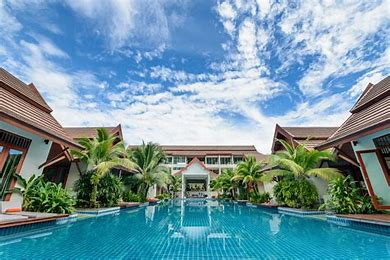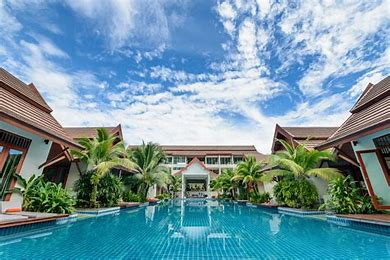

**Here we are Performing an EDA on Hotel Buildings**

In [1]:
# Importing the Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import plotly.graph_objects as go
import seaborn as sns
import plotly as px
import warnings 
warnings.filterwarnings('ignore')

In [32]:
palette = sns.husl_palette(n_colors=6)

In [2]:
# Importing the Dataframe
df = pd.read_csv('Hotel Bookings.csv')

In [3]:
# making a copy of the df
df_copy = df

In [5]:
df_copy.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,01-07-2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,01-07-2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,02-07-2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,02-07-2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,03-07-2015


In [7]:
# Shape of df
print(f'There are {df_copy.shape[0]} rows and {df_copy.shape[1]} columns')

There are 119390 rows and 32 columns


In [8]:
# Info about the df
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [125]:
# Stat about the df
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


### Some Observations From This Table
Here are **5 key insights** derived from the dataset summary:

#### 1. **High Cancellation Rate**
* **37% of bookings were canceled**, indicating a significant challenge for occupancy forecasting and revenue stability.

---

#### 2. **Long Lead Times Correlate with Cancellations**

* The **average lead time is 104 days**, but some extend up to **737 days**.
* Long lead times may contribute to higher cancellation rates, suggesting a need for more flexible or tiered cancellation policies.

---

#### 3. **Most Guests Are First-Time Visitors**

* Only **3.2% are repeated guests**, implying **low customer retention**.
* This presents an opportunity to develop **loyalty programs** or improve guest experience to increase repeat business.

---

#### 4. **Families with Children Are Rare**

* The majority of bookings are for **2 adults**, with **very few children or babies**.
* This suggests the hotel may primarily attract **couples or solo travelers**, and could consider tailoring services accordingly (e.g., couples’ packages, business traveler amenities).

---

#### 5. **Most Bookings Have No Special Requests**

* While the **maximum number of special requests is 5**, the **average is just 0.57**, and **parking is rarely required**.
* This may indicate **low personalization**, or that **standard offerings meet most guest needs**—either way, there’s room to explore upselling or premium service options.
---

In [9]:
# Finding unique values in all columns
df.nunique()

hotel                                2
is_canceled                          2
lead_time                          479
arrival_date_year                    3
arrival_date_month                  12
arrival_date_week_number            53
arrival_date_day_of_month           31
stays_in_weekend_nights             17
stays_in_week_nights                35
adults                              14
children                             5
babies                               5
meal                                 5
country                            177
market_segment                       8
distribution_channel                 5
is_repeated_guest                    2
previous_cancellations              15
previous_bookings_not_canceled      73
reserved_room_type                  10
assigned_room_type                  12
booking_changes                     21
deposit_type                         3
agent                              333
company                            352
days_in_waiting_list     

##### We want to know the values inside the column 

In [127]:
categorical_cols=list(set(df.drop(columns=['reservation_status_date','country','arrival_date_month']).columns) - set(df.describe()))
for col in categorical_cols:
  print(col ,':', df[col].unique())

customer_type : ['Transient' 'Contract' 'Transient-Party' 'Group']
market_segment : ['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Complementary' 'Groups'
 'Undefined' 'Aviation']
distribution_channel : ['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']
meal : ['BB' 'FB' 'HB' 'SC' 'Undefined']
reservation_status : ['Check-Out' 'Canceled' 'No-Show']
assigned_room_type : ['C' 'A' 'D' 'E' 'G' 'F' 'I' 'B' 'H' 'P' 'L' 'K']
hotel : ['Resort Hotel' 'City Hotel']
reserved_room_type : ['C' 'A' 'D' 'E' 'G' 'F' 'H' 'L' 'P' 'B']
deposit_type : ['No Deposit' 'Refundable' 'Non Refund']


#### Cleaning the Dataset

In [10]:
# Finding The Number of Duplicated 
df.duplicated().value_counts()

False    87396
True     31994
Name: count, dtype: int64

In [11]:
# Dropping the Duplicated Column
df = df.drop_duplicates()

In [12]:
# Checking the shape of new df
print(f'There are {df.shape[0]} rows and {df.shape[1]} columns')

There are 87396 rows and 32 columns


In [13]:
# Finding null values
df.isnull().sum().sort_values(ascending = False)[:5]

company               82137
agent                 12193
country                 452
children                  4
reserved_room_type        0
dtype: int64

**Hence we can see that there are *82137* Null Values in Company and *12193* Null Values in agent and so on**

In [14]:
# Dealing with null-values 
# 1. filling null values with 0 in company and agent column 
df[['company','agent']] = df[['company','agent']].fillna(0)

# 2. filling null values with others in country 
df['country'] = df['country'].fillna('others')

# 3. filling null values with mean of childrens
df['children'].fillna(df['children'].mean(), inplace = True)

In [15]:
# Confirming that values are removed
df.isnull().sum().sort_values(ascending = False) [:5]

hotel                          0
is_canceled                    0
reservation_status             0
total_of_special_requests      0
required_car_parking_spaces    0
dtype: int64

*Changing Datatype of some columns to make them more flexible to work with.*

In [16]:
# Convert 'reservation_status_date' column to datetime format, 
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'], dayfirst=True)

# Convert the 'children', 'company', and 'agent' columns to integer type.
df[['children', 'company', 'agent']] = df[['children', 'company', 'agent']].astype('int64')

In [17]:
len(df[df['adults'] +df['children'] +df['babies'] == 0])

df.drop(df[df['adults'] +df['children'] +df['babies'] == 0].index , inplace= True)

In [18]:
df['total people']= df['adults'] +df['children'] +df['babies']
df['total stayed'] = df['stays_in_weekend_nights'] + df['stays_in_week_nights']   

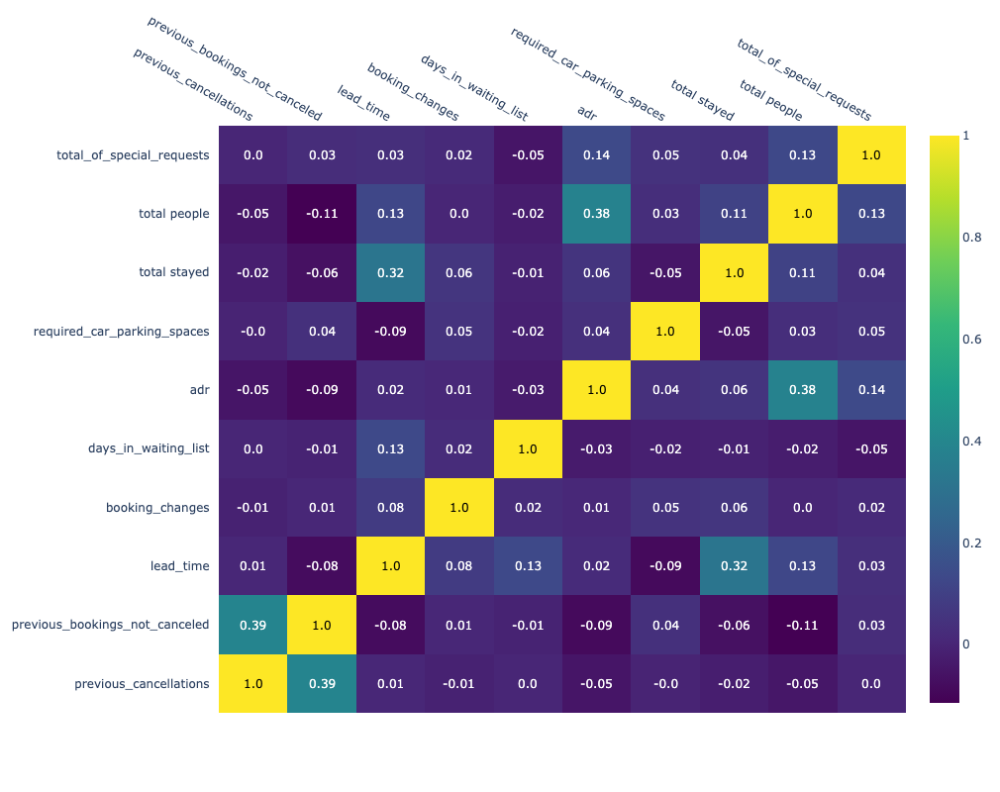

In [22]:
co_relation_matrix = numeric_values.corr()

# Create annotated heatmap with a valid Plotly colorscale
heatmap = ff.create_annotated_heatmap(
    z=co_relation_matrix.values,
    x=list(co_relation_matrix.columns),
    y=list(co_relation_matrix.index),
    annotation_text=co_relation_matrix.round(2).values,
    colorscale='viridis',  # Replaced 'rocket_r' with 'viridis'
    showscale=True
)

heatmap.update_layout(width=800, height=800)
heatmap.show()

Here are the observations from the correlation matrix presented as bullet points:

- People tend to plan slightly ahead for longer stays.
- Around 13% of all guests have made a special request in their booking.
- There are very few instances where transactions have been canceled afterward.

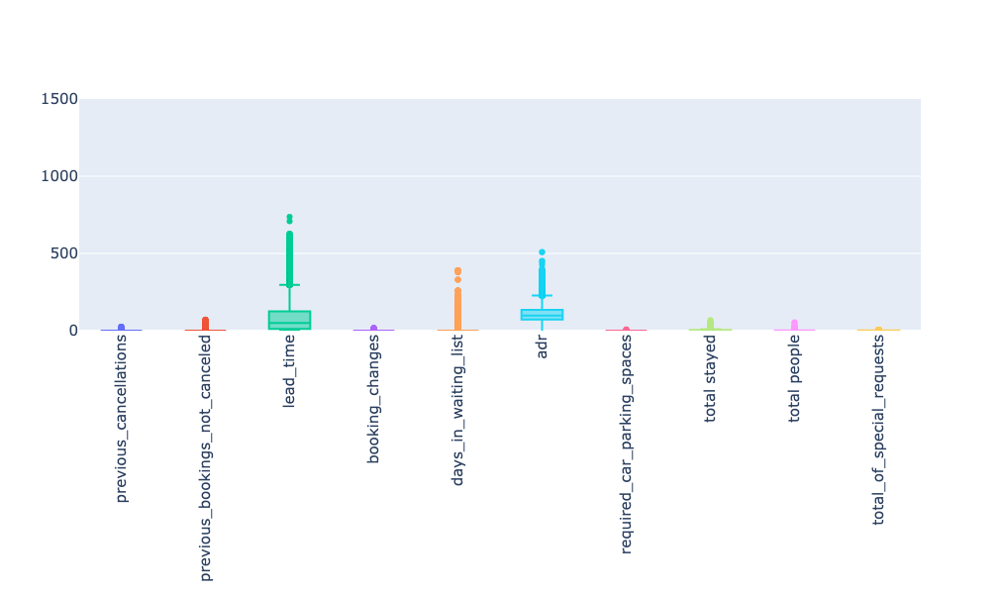

In [25]:
fig = go.Figure()

for col in numeric_values.columns:
    fig.add_trace(
        go.Box(
            y=numeric_values[col],
            name=col,
            showlegend=False
        )
    )

fig.update_layout(
    width=1000,
    height=600,
    xaxis=dict(tickangle=-90, tickfont=dict(size=15)),
    yaxis=dict(
        tickfont=dict(size=15),
        range=[0, 1500]
    )
)

fig.show()

**Here we see in column adr the value is beyond normal range so it indicates that value is a outlier.**

In [26]:
# Removing outliers
df.drop(df[df['adr'] > 5000].index, inplace = True) 

### Performing EDA 

#### 1. Booking percentage of hotels

In [29]:
groupby_hotel = df.groupby('hotel')
d1 = (pd.DataFrame((groupby_hotel.size() / df.shape[0]) * 100)
        .reset_index().rename(columns={0: 'Booking %'}))

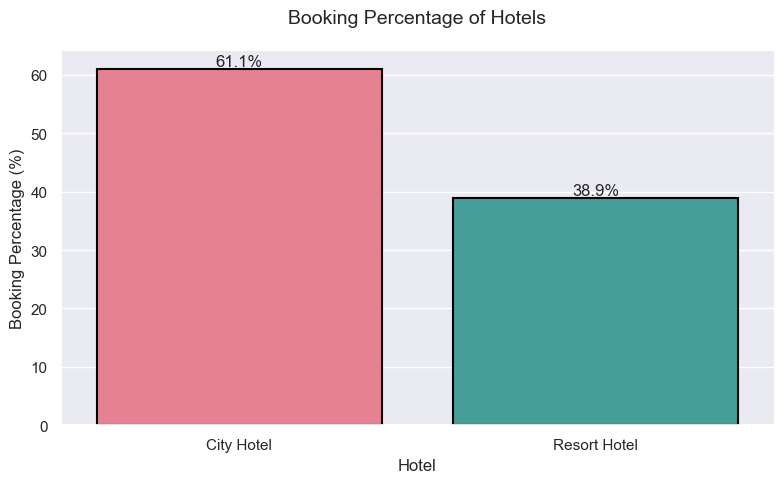

In [34]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(8, 5))

# Number of unique hotels (assuming 2 hotels, but you can generalize)
n_hotels = len(d1['hotel'].unique())
palette = sns.husl_palette(n_colors=n_hotels)

ax = sns.barplot(
    x='hotel',
    y='Booking %',
    data=d1,
    palette=palette,         # Use husl_palette here
    edgecolor='black',               
    linewidth=1.5                    
)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.1f}%',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 5),
        textcoords='offset points',
        fontsize=12
    )

plt.title('Booking Percentage of Hotels', fontsize=14, pad=20)
plt.xlabel('Hotel', fontsize=12)
plt.ylabel('Booking Percentage (%)', fontsize=12)

sns.despine()
plt.tight_layout()
plt.show()

We can see that around Around 60% people prefer City hotel and 40% people prefer Resort hotel.

#### 2. Which Agent makes most no. of bookings

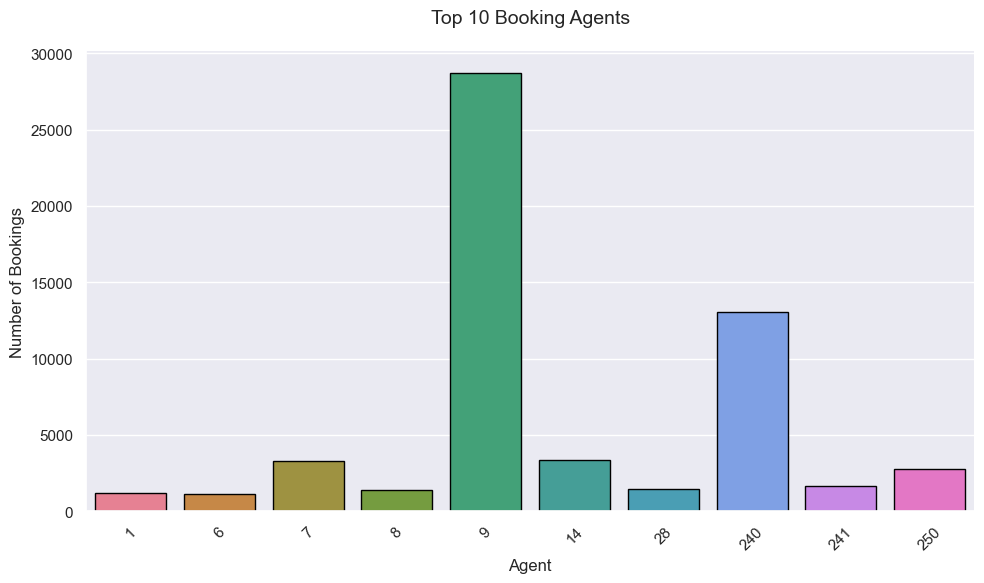

In [37]:
naming_columns = df.groupby('agent').size().reset_index(name='num_of_bookings')
naming_columns.sort_values(by='num_of_bookings', ascending=False, inplace=True)
naming_columns = naming_columns[naming_columns['agent'] != 0]
top_booking_agent = naming_columns.head(10)

palette = sns.husl_palette(n_colors=10)  

sns.set_theme(style="darkgrid")  
plt.figure(figsize=(10, 6))

ax = sns.barplot(
    x='agent',
    y='num_of_bookings',
    data=top_booking_agent,
    palette=palette,           
    edgecolor='black',
    linewidth=1
)

plt.title('Top 10 Booking Agents', fontsize=14, pad=20)
plt.xlabel('Agent', fontsize=12)
plt.ylabel('Number of Bookings', fontsize=12)
plt.xticks(rotation=45)

sns.despine()
plt.tight_layout()
plt.show()

We can see that **Agent 9** makes Most of the booking and is Therefore Our Most Valued Customer

#### 3.Most prefered meal by customers.

In [231]:
# Most prefrerd meal dataset
prefered_meal = (pd.DataFrame(df['meal'].value_counts().reset_index()))
prefered_meal.head()

,meal,count
0,BB,67906
1,SC,9391
2,HB,9080
3,Undefined,492
4,FB,360


In [39]:
prefered_meal = df['meal'].value_counts().reset_index()
prefered_meal.columns = ['meal', 'count']

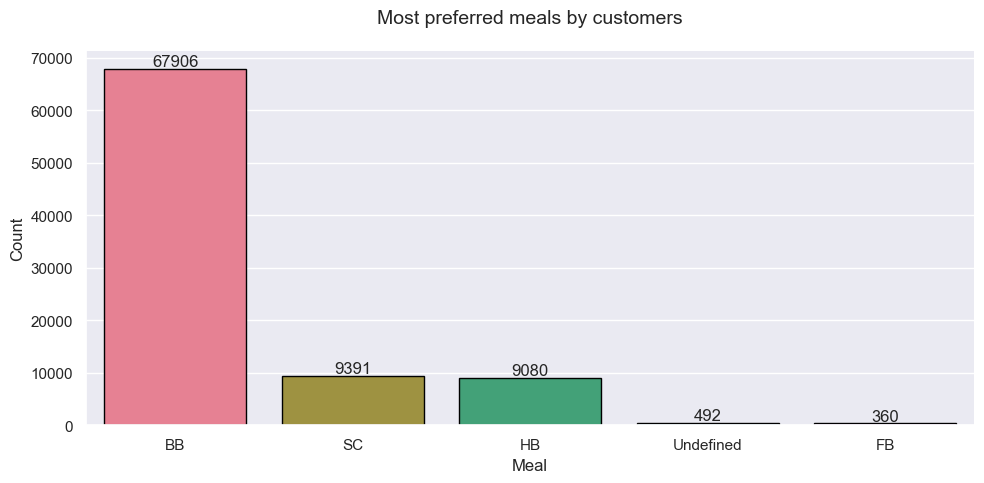

In [40]:
plt.figure(figsize=(10, 5))
palette = sns.husl_palette(n_colors=len(prefered_meal['meal']))

ax = sns.barplot(
    x='meal',
    y='count',
    data=prefered_meal,
    order=prefered_meal['meal'],
    palette=palette,
    edgecolor='black',
    linewidth=1
)

plt.title('Most preferred meals by customers', fontsize=14, pad=20)
plt.xlabel('Meal', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Add bar labels
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.0f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 5),
        textcoords='offset points',
        fontsize=12
    )

sns.despine()
plt.tight_layout()
plt.show()

#### 4. What is the percentage distribution of "Customer Type"?

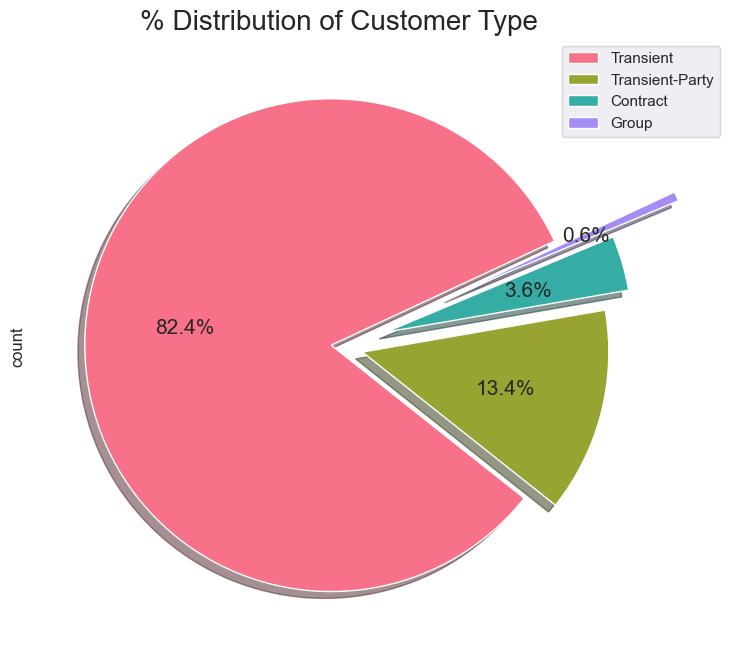

In [42]:
colors = sns.color_palette("husl", 4)

explode = [0.03, 0.1, 0.2, 0.5]
df['customer_type'].value_counts().plot.pie(
    explode=explode,
    autopct='%1.1f%%',
    shadow=True,
    figsize=(12, 8),
    fontsize=15,
    labels=None,
    startangle=25,
    colors=colors
)

labels = df['customer_type'].value_counts().index.tolist()
plt.title('% Distribution of Customer Type', fontsize=20)
plt.legend(bbox_to_anchor=(0.85, 1), loc='upper left', labels=labels)
plt.show()

Transient customer type is more which is 82.4 %. Percentage of Booking associated by the Group is vey low.

#### 5. Hotel cancelation rate

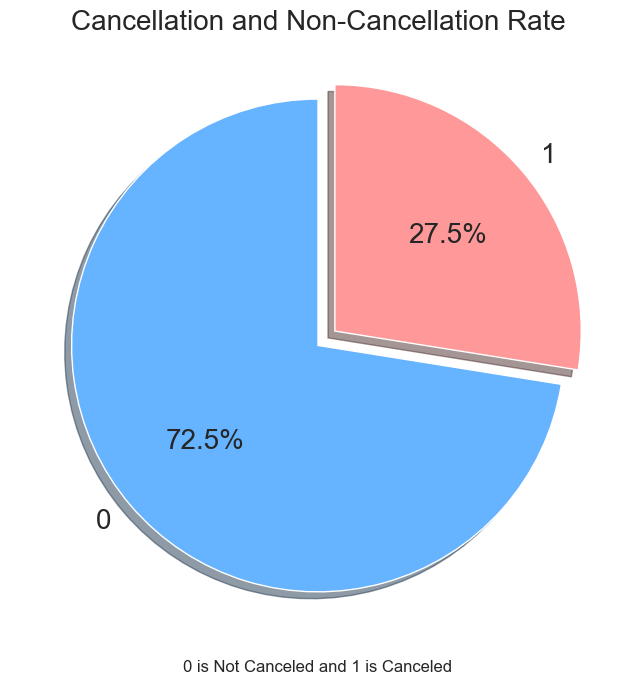

In [44]:
colors = ['#66b3ff', '#ff9999']

explode = [0.0, 0.09]
df['is_canceled'].value_counts().plot.pie(
    explode=explode,
    startangle=90,
    autopct='%1.1f%%',
    shadow=True,
    figsize=(8, 8),
    fontsize=20,
    colors=colors
)

plt.title('Cancellation and Non-Cancellation Rate', fontsize=20)
plt.xlabel('0 is Not Canceled and 1 is Canceled')
plt.ylabel('')
plt.show()

27.5% people cancelled their booking. We have to find out reasons why these people cancelled their bookings. Also feedback can be taken from guests who cancel their bookings.

#### 6. Which Distribution Channel is Used by the Customer for Hotel Booking?

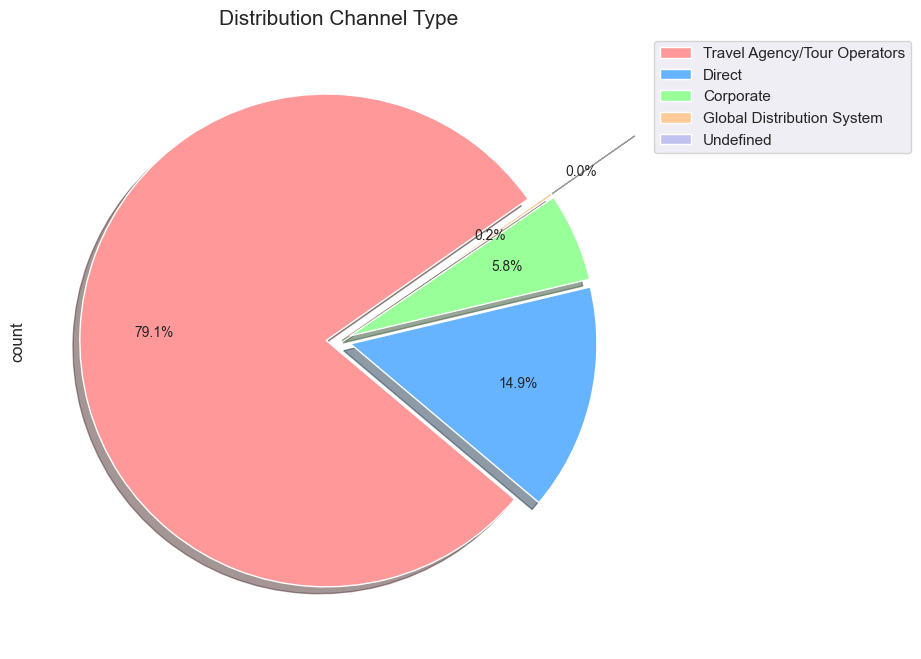

In [45]:
distribution_type = df['distribution_channel'].value_counts()
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']
myexplode = [0.05, 0.05, 0.05, 0.05, 0.5]
labels = ['Travel Agency/Tour Operators', 'Direct', 'Corporate', 'Global Distribution System', 'Undefined']

distribution_type.plot.pie(
    figsize=(8, 8),
    fontsize=10,
    shadow=True,
    explode=myexplode,
    autopct='%1.1f%%',
    pctdistance=0.7,
    labels=None,
    startangle=35,
    colors=colors
)

plt.title('Distribution Channel Type', fontsize=15)
plt.legend(bbox_to_anchor=(1, 1), labels=labels, loc='upper left')
plt.show()

**Observation:**
- 79.1% customer uses Travel Agency (TA)/Tour Operators(TO).
- 14.9% customers direct book hotel.
- 5.8% customers booking through Corporate.
- 0.2% booking comes through Global Distribution System.

#### 7. Percentage of Booking changes made by the customer.

In [47]:
# Calculate value counts for booking changes
booking_changes = df['booking_changes'].value_counts().reset_index()
booking_changes.head()

,booking_changes,count
0,0,71425
1,1,10867
2,2,3483
3,3,862
4,4,347


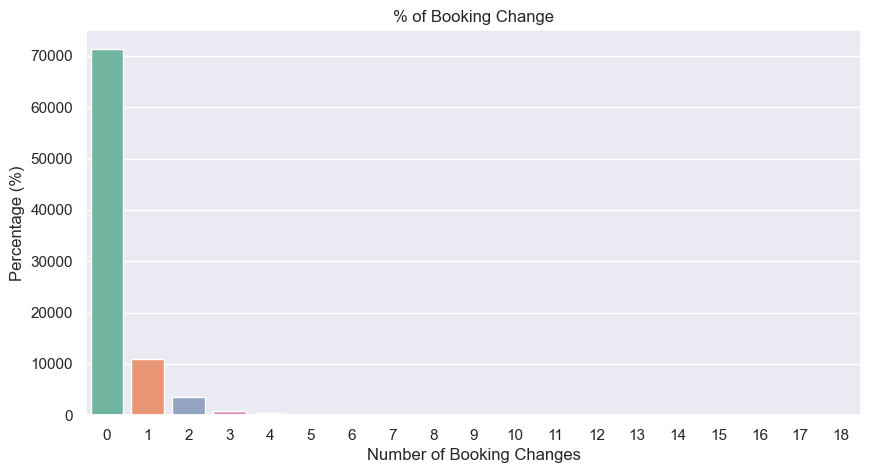

In [48]:
plt.figure(figsize=(10, 5))

sns.barplot(
    x='booking_changes', 
    y='count', 
    data=booking_changes,
    palette=['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854']
)

plt.title("% of Booking Change")
plt.xlabel('Number of Booking Changes')
plt.ylabel('Percentage (%)')
plt.show()

#### 8. From which country, guest visited the most.

In [49]:
guest_by_country = df['country'].value_counts().reset_index()[:10]
guest_by_country.head()

,country,count
0,PRT,27354
1,GBR,10424
2,FRA,8823
3,ESP,7244
4,DEU,5385


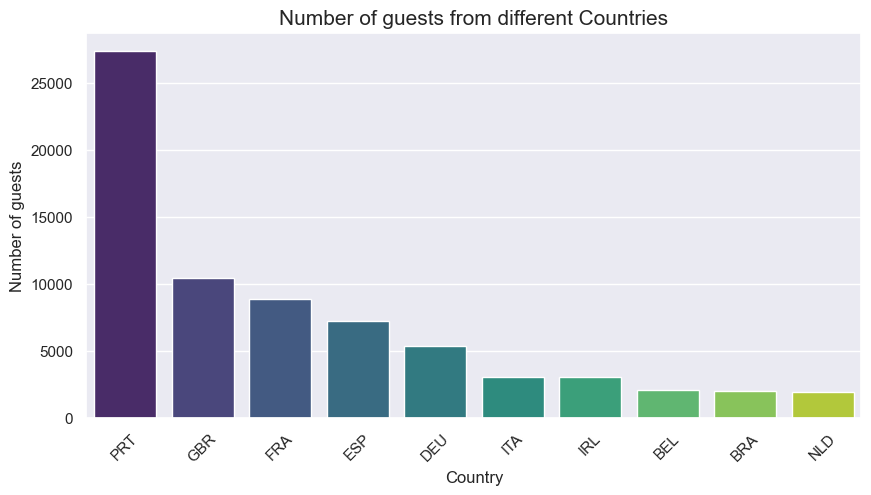

In [50]:
plt.figure(figsize=(10, 5))

sns.barplot(x=guest_by_country['country'], y=guest_by_country['count'], order=guest_by_country['country'], palette='viridis')

plt.ylabel('Number of guests', fontsize=12)
plt.xlabel('Country', fontsize=12)
plt.title('Number of guests from different Countries', fontsize=15)
plt.xticks(rotation=45)
plt.show()

#### 9. Which Year had the Highest Bookings?

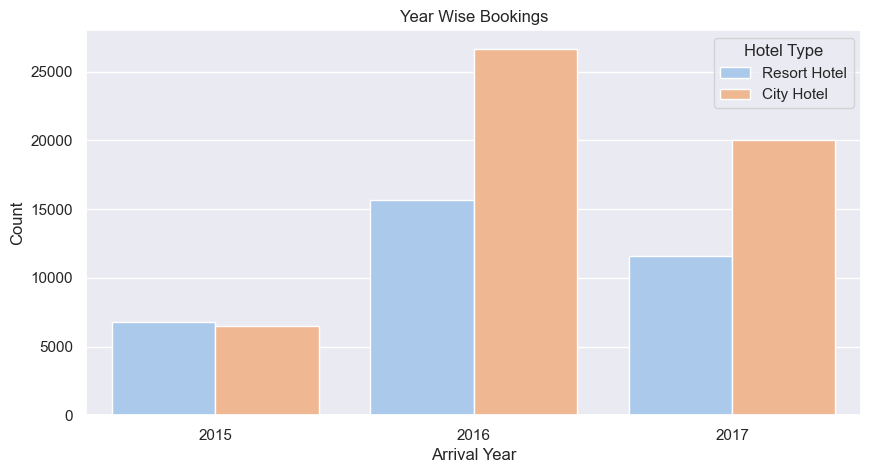

In [51]:
plt.figure(figsize=(10, 5))

sns.countplot(
    x=df['arrival_date_year'],
    hue=df['hotel'],
    palette='pastel'
)

plt.title("Year Wise Bookings")
plt.xlabel('Arrival Year')
plt.ylabel('Count')
plt.legend(title='Hotel Type', loc='upper right')
plt.show()

**Observation:**
- 2015 had less 7000 bookings.
- 2016 had the higest bookings.
- Overall, City Hotels had the most of the bookings.

#### 10. In which month most of the bookings happened?

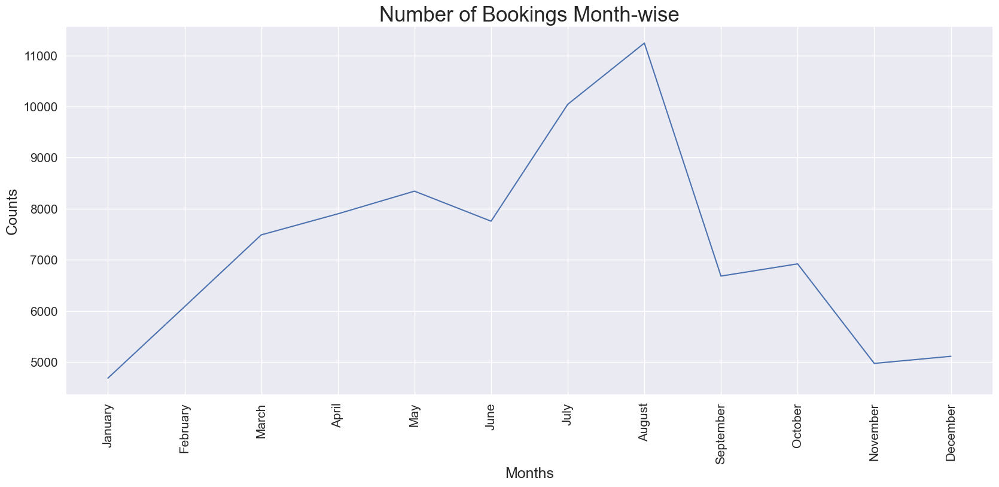

In [52]:
Booking_by_month = df.groupby(['arrival_date_month'])['hotel'].count().reset_index().rename(columns={'hotel': 'Counts', 'arrival_date_month': 'Months'})

months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
Booking_by_month['Months'] = pd.Categorical(Booking_by_month['Months'], categories=months, ordered=True)

sns.set_theme(style="darkgrid")
plt.figure(figsize=(20, 8))
sns.lineplot(x=Booking_by_month['Months'], y=Booking_by_month['Counts'])

plt.title('Number of Bookings Month-wise', fontsize=25)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.ylabel('Counts', fontsize=18)
plt.xlabel('Months', fontsize=18)
plt.show()

**Observation** :
* July and August months had the most Bookings. Summer vaccation can be the reason for the bookings.

#### 11. Most preferred room type by the customers

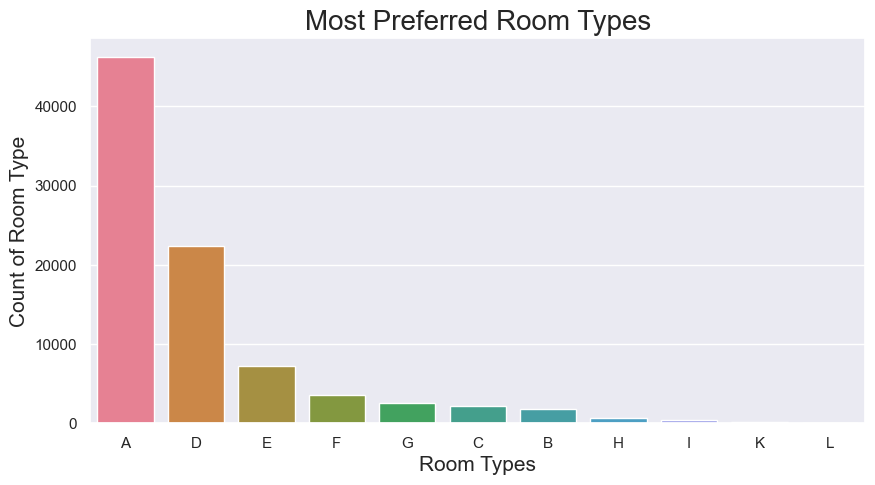

In [54]:
plt.figure(figsize=(10, 5))
palette = sns.color_palette("husl", len(df['assigned_room_type'].unique()))
sns.countplot(x=df['assigned_room_type'], order=df['assigned_room_type'].value_counts().index, palette=palette)

plt.ylabel('Count of Room Type', fontsize=15)
plt.xlabel('Room Types', fontsize=15)
plt.title('Most Preferred Room Types', fontsize=20)
plt.show()

**Observation** : Most preferred Room type is 'A'.

#### 12. count of repeated guest?

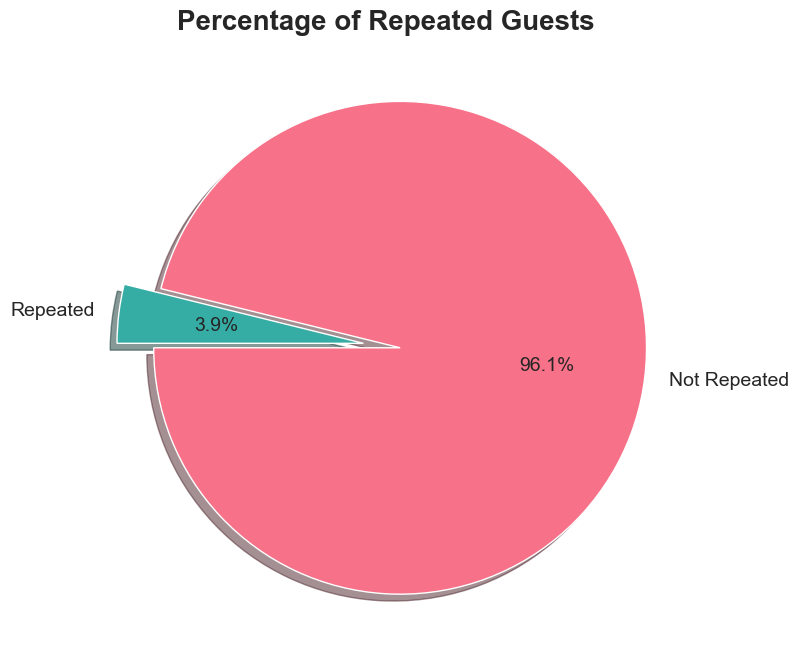

In [55]:

colors = sns.color_palette("husl", 2)

plt.figure(figsize=(12, 8))
plt.pie(
    df['is_repeated_guest'].value_counts(),
    explode=(0.06, 0.09),
    labels=['Not Repeated', 'Repeated'],
    autopct='%1.1f%%',
    startangle=180,
    shadow=True,
    colors=colors,
    textprops={'fontsize': 14}
)

plt.title('Percentage of Repeated Guests', fontsize=20, fontweight='bold')
plt.show()

**Observation:**
* Repeated guests are very few which only 3.9 %.
* In order to retain the guests, management should take feedbacks from guests and try to improve the services.


#### 13. What is Percentage distribution of Deposite type ?

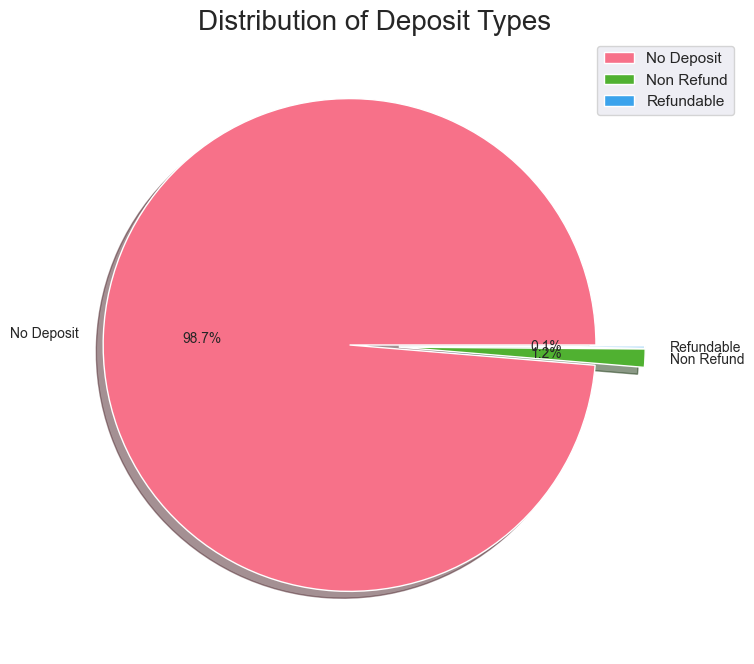

In [56]:
deposit_type_counts = df['deposit_type'].value_counts()
labels = deposit_type_counts.index.tolist()
sizes = deposit_type_counts.values
colors = sns.color_palette("husl", len(labels))
explode = (0.1, 0.1, 0.1)

plt.figure(figsize=(14, 8))
plt.pie(
    sizes,
    explode=explode,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',
    shadow=True,
    textprops={'fontsize': 10}
)

plt.title('Distribution of Deposit Types', fontsize=20)
plt.legend(bbox_to_anchor=(0.85, 1), loc='upper left', labels=labels)
plt.ylabel('')
plt.show()

**Observation** :
* 98.7 % of the guests prefer "No deposit" type of deposit.

#### 14. Which Hotel type has the highest ADR?

In [57]:
highest_ADR = pd.DataFrame(df.groupby(['hotel']) ['adr'].mean().reset_index())
highest_ADR

,hotel,adr
0,City Hotel,111.172693
1,Resort Hotel,99.059517


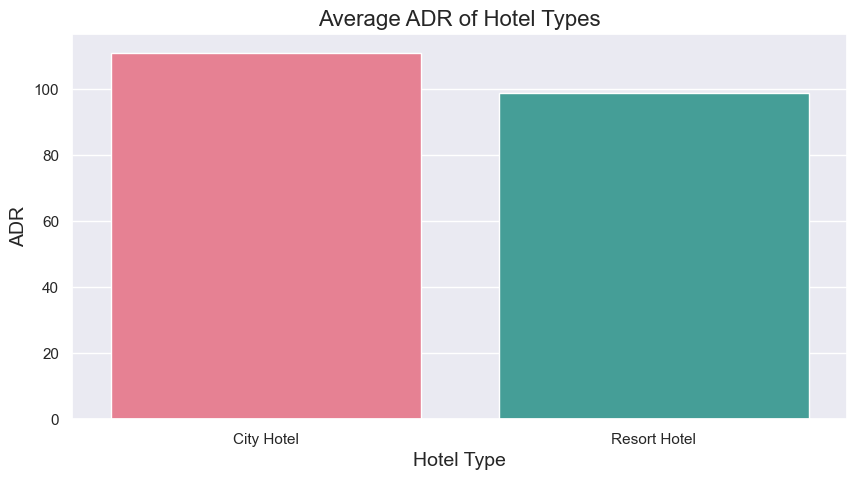

In [58]:
sns.set_theme(style="darkgrid")

colors = sns.color_palette("husl", len(highest_ADR['hotel'].unique()))

plt.figure(figsize=(10, 5))
sns.barplot(x=highest_ADR['hotel'], y=highest_ADR['adr'], palette=colors)

plt.xlabel('Hotel Type', fontsize=14)
plt.ylabel('ADR', fontsize=14)
plt.title('Average ADR of Hotel Types', fontsize=16)
plt.show()

**Observation** :
* City Hotel has the highest ADR. This means City Hotels are generating more revenue than the resort hotels. More the ADR, more is the revenue.

#### 15. Which Hotel Type has more lead time?

In [59]:
# group by with hotel and lead time
avg_lead_time = pd.DataFrame(df.groupby(['hotel'])['lead_time'].mean()).reset_index()

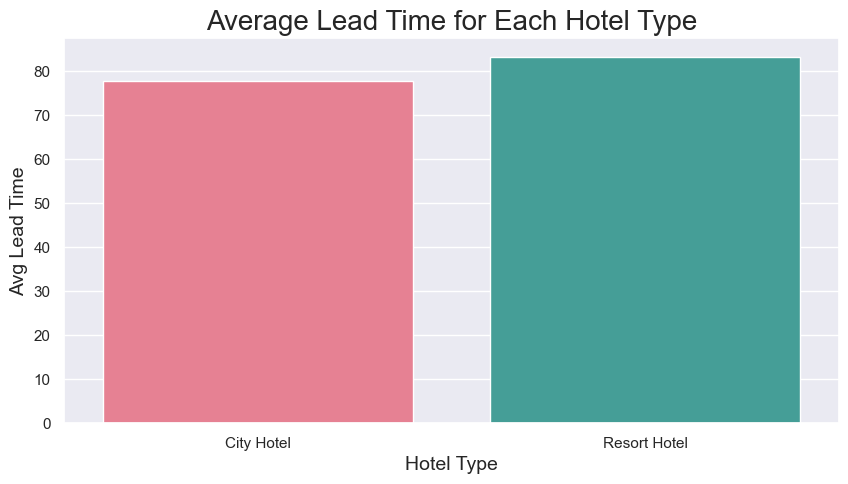

In [60]:
colors = sns.color_palette("husl", len(avg_lead_time['hotel'].unique()))

plt.figure(figsize=(10, 5))
sns.barplot(x=avg_lead_time['hotel'], y=avg_lead_time['lead_time'], palette=colors)

plt.xlabel('Hotel Type', fontsize=14)
plt.ylabel('Avg Lead Time', fontsize=14)
plt.title('Average Lead Time for Each Hotel Type', fontsize=20)
plt.show()

**Observation** : City hotel has more lead time than resort hotel.

#### 16. ADR across the different month.

In [61]:
# Grouping by
ADR_by_month = df.groupby(['arrival_date_month','hotel'])['adr'].mean().reset_index().rename(columns= {'Counts': 'Hotel Type' , 'arrival_date_month': 
                                                                                                       'Months'})
ADR_by_month.head()

,Months,hotel,adr
0,April,City Hotel,117.314134
1,April,Resort Hotel,79.283805
2,August,City Hotel,125.148662
3,August,Resort Hotel,187.566659
4,December,City Hotel,93.204767


In [62]:
# list of months
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# sorting dataframe by months
ADR_by_month['Months'] = pd.Categorical(ADR_by_month['Months'], categories = months, ordered = True )

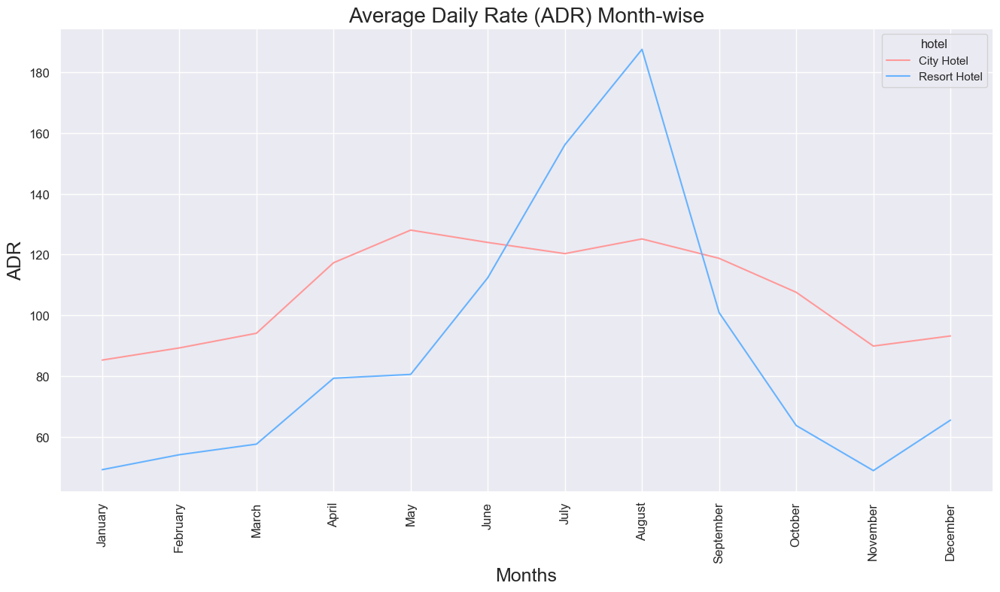

In [63]:
# Custom colors for each hotel type
colors = ['#ff9999', '#66b3ff']

# Plotting the graph with seaborn
plt.figure(figsize=(16, 8))
sns.lineplot(x=ADR_by_month['Months'], y=ADR_by_month['adr'], hue=ADR_by_month['hotel'], palette=colors)

# Adding labels and title
plt.title('Average Daily Rate (ADR) Month-wise', fontsize=20)
plt.xlabel('Months', fontsize=18)
plt.ylabel('ADR', fontsize=18)
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)

# Displaying the plot
plt.show()

**Observation** :
* For Resort Hotel, ADR is high in the months June,July,August as compared to City Hotels. May be Customers/People wants to spend their Summer vaccation in Resorts Hotels.
* The best time for guests to visit Resort or City hotels is January, February, March, April,October, November and December as the avrage daily rate in this month is very low.

#### 17. Is there any preferance for the "Reserved Room Type"?

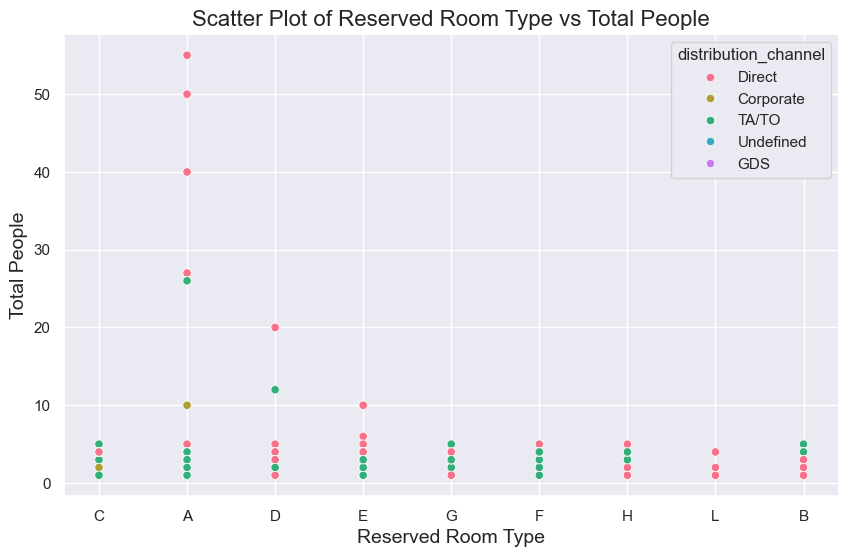

In [64]:
unique_channels = df['distribution_channel'].nunique()
colors = sns.color_palette("husl", unique_channels)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='reserved_room_type', y='total people', hue='distribution_channel', palette=colors)

plt.xlabel('Reserved Room Type', fontsize=14)
plt.ylabel('Total People', fontsize=14)
plt.title('Scatter Plot of Reserved Room Type vs Total People', fontsize=16)
plt.show()

**Observation** :
* There is strong propensity for the A,D and E reserved_room_type.
* Also, for prescriptive analysis, P category can be evaluated when hotel get more years of data.
* Reserved_room_type A and B is the preferred choice for "Corporate".

#### 18. What is the monthly occupancy of the hotel for the threee years of data that we have with us, i.e., for 2015, 2016 and 2017?

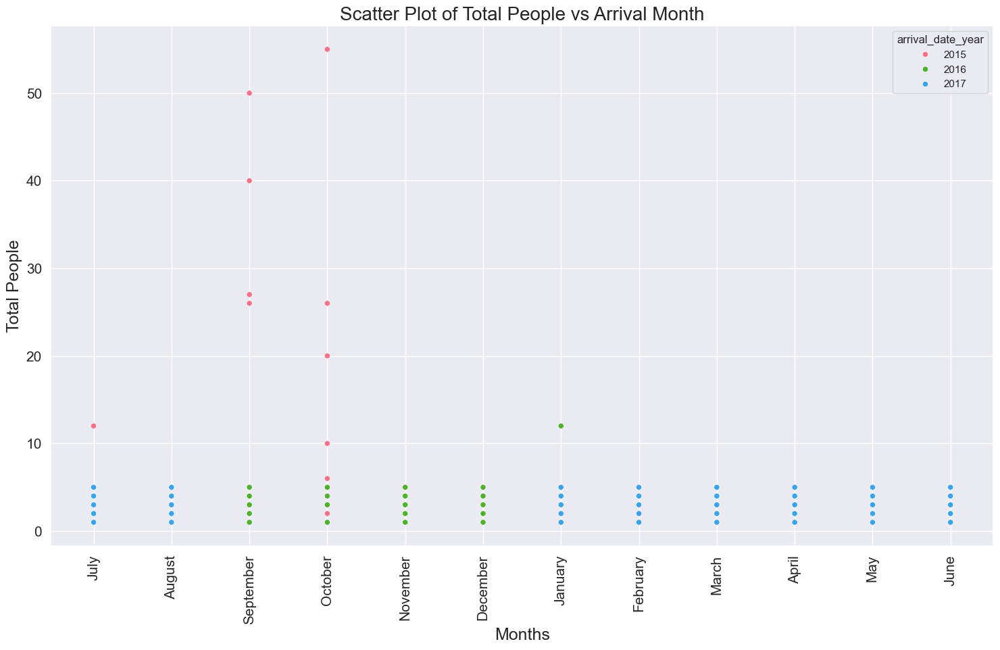

In [65]:
unique_years = df['arrival_date_year'].nunique()
palette = sns.color_palette("husl", unique_years)

plt.figure(figsize=(18, 10))
sns.scatterplot(data=df, x='arrival_date_month', y='total people', hue='arrival_date_year', palette=palette)

plt.xlabel('Months', fontsize=18)
plt.ylabel('Total People', fontsize=18)
plt.title('Scatter Plot of Total People vs Arrival Month', fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.show()

**Observation** :
* For 2015, maximum number of occupancy was there in the months of September and October (2 months).
* Further for 2016, maximum number of occupancy was there in the months of September, October, November and December (4 months), which was better than previous year, 2016.
* Then for the year 2017, good number of occupancy was there in the hotel from January to August. But for the months from Sept to Dec, there was a decline in occupancy of the Hotel.

#### 19. Is there any relation between "reserved_room_type", "assigned_room_type" and "is_repeated_guest"?

In [66]:
pd.pivot_table(data = df, index = 'reserved_room_type', columns = 'assigned_room_type', values = 'is_repeated_guest', aggfunc = 'sum')

assigned_room_type,A,B,C,D,E,F,G,H,I,K,L
reserved_room_type,,,,,,,,,,,
A,1745.0,28.0,56.0,584.0,92.0,44.0,19.0,8.0,37.0,30.0,NaN
B,2.0,11.0,NaN,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN
C,0.0,0.0,25.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,NaN
D,15.0,4.0,1.0,305.0,13.0,8.0,2.0,0.0,8.0,5.0,NaN
E,0.0,0.0,1.0,1.0,153.0,11.0,4.0,0.0,9.0,2.0,NaN
F,1.0,3.0,NaN,2.0,1.0,55.0,1.0,0.0,1.0,1.0,NaN
G,0.0,0.0,1.0,NaN,2.0,2.0,57.0,0.0,1.0,0.0,NaN
H,NaN,NaN,NaN,0.0,NaN,NaN,1.0,10.0,1.0,NaN,NaN
L,0.0,0.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0


**Observation** :
* Guests who were assigned the same room which was there at the time of booking, the above Summary clearly depicts that such guests revisited the hotel.
* Focusing not to change the registered room, points towards the growth in revenue and the image of the hotel.

#### 20. Which hotel has high chance that its customer will return for another stay?

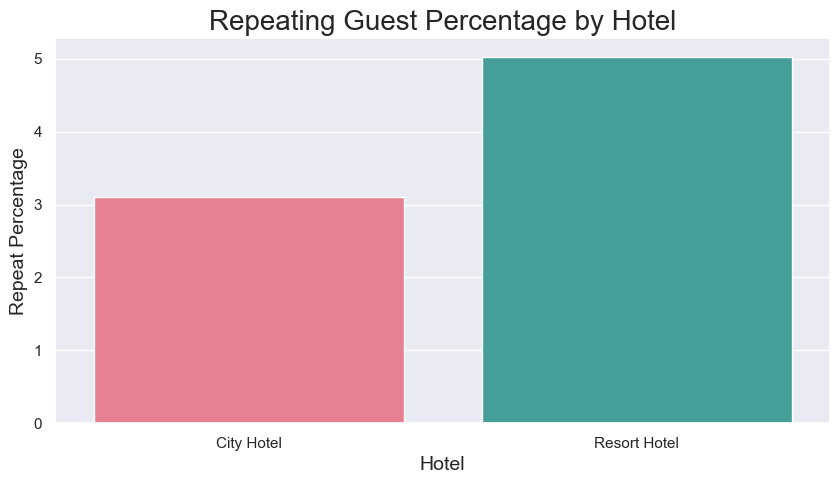

In [67]:
repeated_cust = df[df['is_repeated_guest'] == 1]
repeat_grp = repeated_cust.groupby('hotel')
df2 = pd.DataFrame(repeat_grp.size()).rename(columns={0: 'total_repeated_guests'})

grouped_by_hotel = df.groupby('hotel')
total_booking = grouped_by_hotel.size()
df3 = pd.DataFrame(total_booking).rename(columns={0: 'total_bookings'})

df4 = pd.concat([df2, df3], axis=1)
df4['repeat_%'] = round((df4['total_repeated_guests'] / df4['total_bookings']) * 100, 2)

palette = sns.color_palette("husl", len(df4))

plt.figure(figsize=(10, 5))
sns.barplot(x=df4.index, y=df4['repeat_%'], palette=palette)

plt.title('Repeating Guest Percentage by Hotel', fontsize=20)
plt.xlabel('Hotel', fontsize=14)
plt.ylabel('Repeat Percentage', fontsize=14)
plt.show()

#### Final Observations

**Observation** :
- Around 60% of people prefer City hotels, while 40% prefer Resort hotels, making City hotels the busiest.
- Agent no.9 makes the majority of bookings.
- Most customers prefer BB-type meals.
- 27.5% of people cancelled their bookings. Understanding their reasons for cancellation and gathering feedback could help improve customer retention.
- Nearly 82% of bookings remained unchanged by guests.
- The majority of guests (over 25,000) are from Portugal.
- In 2015, there were fewer than 7000 bookings, whereas 2016 saw the highest number of bookings overall, with City hotels accounting for the most.
- Bookings peak in July and August, likely due to summer vacations.
- Transient customers account for 82.4% of bookings, with group bookings being significantly lower.
- Repeated guests make up only 3.9%. To retain them, management should seek feedback to improve services.
- 98.7% of guests prefer the "No deposit" option.
- City hotels have the highest Average Daily Rate (ADR), indicating higher revenue generation compared to Resort hotels.
- City hotels generally have longer lead times compared to Resort hotels.
- ADR for Resort hotels is higher in June, July, and August compared to City hotels, possibly due to summer vacation preferences.
- January, February, March, April, October, November, and December are the best months to visit both Resort and City hotels, as the average daily rates are lower.
- Guests who stay in the same room as booked are more likely to revisit, contributing to revenue growth and enhancing the hotel's reputation.
- Resort hotels have a slightly higher rate of customer return compared to City hotels.
- Non-repeated guests are more likely to cancel their bookings.
- 'Direct' and 'Online TA' channels contribute the most to bookings for both types of hotels. The aviation segment should focus on increasing bookings for City hotels.
